In [1]:
# 호환성 및 성능 관련 경고를 무시
import warnings
warnings.filterwarnings("ignore")

In [2]:
# 필요한 라이브러리 임포트
import numpy as np
import tensorflow as tf
print(tf.__version__)

2.6.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

# 모델 학습을 위한 데이터셋(dataset) 준비

# tensorflow_datasets에 관한 세부 내용 참조링크

https://www.tensorflow.org/datasets/catalog/tf_flowers

* 참조할 데이타셋 링크 : http://download.tensorflow.org/example_images/flower_photos.tgz

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load( #데이터셋을 로드
    'tf_flowers',                                            #사용 데이터셋 이름
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],  #데이터셋을 훈련(기차), 검증(검증), 테스트(테스트)로 설정
    with_info=True,                                          #데이터셋의 데이터(설명,좌우 등)
    as_supervised=True,                                      #(image, label) 형식으로 데이터를 반환
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /aiffel/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [5]:
!mkdir -p ~/aiffel/tf_flowers # 로컬 디렉토리에 데이터셋 심볼릭 링크 생성

In [6]:
!ln -s ~/tensorflow_datasets/* ~/aiffel/tf_flowers

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


* (image, label) -> ((None, None, 3), ()) : image의 shape/label의 shape
* image : (height, width, channel), 정해져 있지 않은 사이즈이기 때문에 None으로 표시
* 채널의 수 : 3 (RGB)

In [8]:
# 데이터셋의 각 분할에 대한 샘플 수 계산
train_count = len(raw_train)
val_count = len(raw_validation)
test_count = len(raw_test)
total_count = train_count+val_count+test_count

print(f"전체 데이터 개수: {total_count}")
print(f"훈련 세트 개수: {train_count} ({train_count/total_count*100:.2f}%)")
print(f"검증 세트 개수: {val_count} ({val_count/total_count*100:.2f}%)")
print(f"테스트 세트 개수: {test_count} ({test_count/total_count*100:.2f}%)")

전체 데이터 개수: 3670
훈련 세트 개수: 2936 (80.00%)
검증 세트 개수: 367 (10.00%)
테스트 세트 개수: 367 (10.00%)


In [9]:
# 클래스 수 확인
num_classes = metadata.features['label'].num_classes
print(num_classes)

5


# 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [10]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


* raw_train 안에 있는 데이터를 확인, tf.data.Dataset에서 제공하는 take라는 함수를 사용
 - 기능 : 인수로 받은 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수

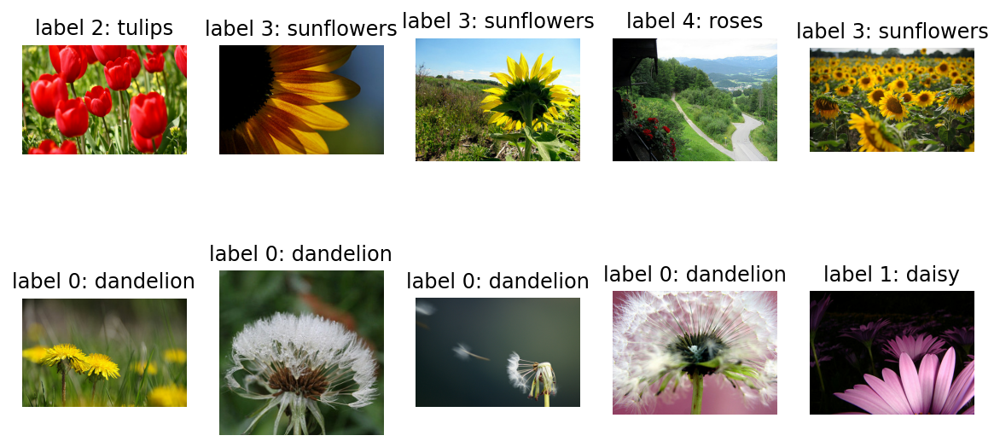

In [11]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

* label 0: dandelion(민들레), label 1:daisy(데이지), 
  label 2:tulips(튤립), label 3:sunflowers(해바라기), label 4:roses(장미)
* 이미지를 같은 포맷으로 통일 : format_example()

* 타입캐스팅(Type Casting) : 형변환이라고도 불리는 타입개스팅은 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미, float()

In [12]:
# 아래 코드는 이미지의 사이즈를 180x180 픽셀로 통일시킬 뿐만 아니라, 
# 각 픽셀값의 scale을 수정해주는 역할도 합니다.

IMG_SIZE = 180 # 리사이징할 이미지의 크기

# 이미지 전처리 함수 정의
def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전. 입력된 이미지를 tf.float32유형으로 변환
    image = (image/127.5) - 1 # 픽셀값의 scale 수정, 이미지는 보통 0에서 255사이의 가치로 표현, 이 배열은 배열 값을 [-1, 1]범위로 스케일링
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) #이미지를 IMG_SIZE x IMG_SIZE크기로 변환
    return image, label   #처리된 이미지와 해당하는 label 반환


* image = (image / 127.5) - 1
 - 이미지는 보통 0에서 255사이의 가치로 표현됩니다.
 - 이 배열은 배열 값을 [-1, 1]범위로 스케일링합니다:
    * 0 → -1
    * 127.5 → 0
    * 255 → 1
 - 신경망의 서서히 학습을 위해 가치의 범위를 조정하는 과정입니다.
    * 0~255 사이의 값들을 그 중간값인 127.5로 나누고 1을 뺐으므로, -1 ~ 1 사이의 실수값이 된다.


In [13]:
# 데이터셋에 전처리 함수 적용하여 이미지 크기 통일
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((180, 180, 3), ()), types: (tf.float32, tf.int64)>


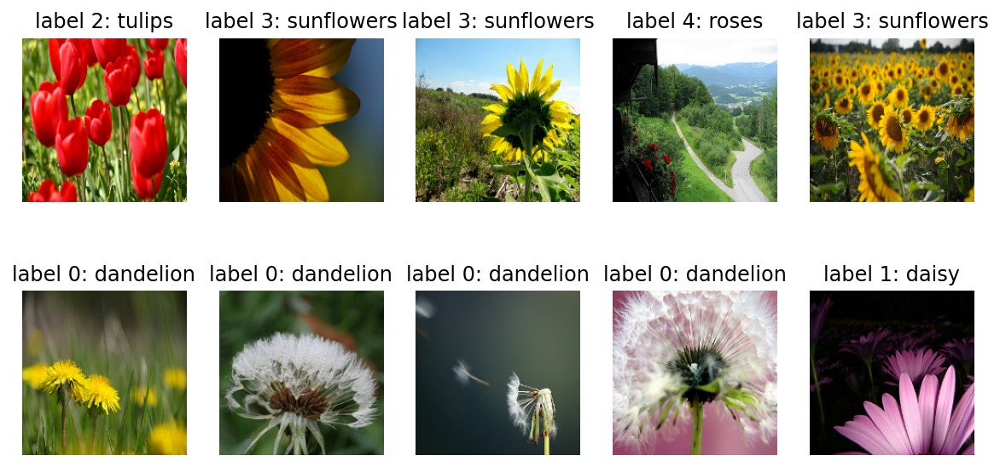

In [14]:
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, 
# -1 ~ 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하였다 ( => image = (image + 1) / 2 )

plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 텐서플로우를 활용해 모델 구조 설계하기

In [15]:
# 모델 구성에 필요한 레이어 임포트
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [16]:
# 간단한 CNN 초기 모델 생성
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(180, 180, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax') # 출력 뉴런 수는 클래스 수와 동일
])

model.summary()  #모델의 전체 구조표시

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 180, 180, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 30976)             0

* shape: (None, height, width, channel) 
* 첫 번째 차원은 데이터의 개수 : None
* feature map
* CNN(Convolutional Neural Net)

* 모델에서 flatten 레이어를 통과한다는 것도 위와 같이 모든 숫자를 일렬로 펼쳐놓는 것 과 같습니다.
* 결과 : 
   - 딥러닝 모델은 (180, 180, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 
     최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있습니다.

# 모델 compile 완료 후 학습시키기

 * learning_rate : 학습률, 0.0001로 설정
 * 모델을 compile 하여 학습할 수 있는 형태로 변환
 
 * optimizer : 학습을 어떤 방식으로 시킬것인지 결정, 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고도 한다
 * loss : 모델이 학습해나가야 하는 방향을 결정
           ex) label 0: dandelion(민들레), label 1:daisy(데이지), 
               label 2:tulips(튤립), label 3:sunflowers(해바라기), label 4:roses(장미)
 * metrics : 모델의 성능을 평가하는 척도
             성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall)등이 있음.

In [17]:
# 모델 컴파일
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate), # 학습률 설정
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [18]:
# 모델을 학습시킬 데이터를 준비
# 배치 크기 및 셔플 버퍼 크기 설정
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [19]:
# BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 3개의 배치를 생성
# 데이터셋을 배치 단위로 묶고 셔플 적용
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)  #모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤뽑기 
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [20]:
# 데이터 배치에서 샘플 하나 가져오기 (입력 형태 확인용)
for image_batch, label_batch in train_batches.take(1):
    break

#image_batch의 shape는 [32, 180, 180, 3], label_batch의 shape는 [32]
image_batch.shape, label_batch.shape

(TensorShape([32, 180, 180, 3]), TensorShape([32]))

# 초기 모델의 성능 확인

In [21]:
validation_steps = 10
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))  #얼마나 모델이 틀렸는지(손실), 낮을수록 좋은 것
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 44s 28ms/step - loss: 1.6338 - accuracy: 0.1437
initial loss: 1.63
initial accuracy: 0.14


# 초기 모델 학습

In [22]:
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 12s 50ms/step - loss: 1.3454 - accuracy: 0.4281 - val_loss: 1.2229 - val_accuracy: 0.4741
Epoch 2/20
92/92 [==============================] - 4s 34ms/step - loss: 1.0583 - accuracy: 0.5749 - val_loss: 1.0102 - val_accuracy: 0.5995
Epoch 3/20
92/92 [==============================] - 4s 34ms/step - loss: 0.9393 - accuracy: 0.6345 - val_loss: 0.9991 - val_accuracy: 0.5886
Epoch 4/20
92/92 [==============================] - 4s 33ms/step - loss: 0.8368 - accuracy: 0.6812 - val_loss: 0.9666 - val_accuracy: 0.6267
Epoch 5/20
92/92 [==============================] - 4s 34ms/step - loss: 0.7144 - accuracy: 0.7452 - val_loss: 0.9060 - val_accuracy: 0.6431
Epoch 6/20
92/92 [==============================] - 4s 34ms/step - loss: 0.6194 - accuracy: 0.7851 - val_loss: 1.0147 - val_accuracy: 0.6076
Epoch 7/20
92/92 [==============================] - 4s 34ms/step - loss: 0.5332 - accuracy: 0.8236 - val_loss: 0.9582 - val_accuracy: 0.6376
Epoch 8/20
9

# 모델 학습곡선 확인 및 예측 결과 시각화하기

* accuracy는 훈련 데이터셋에 대한 정확도, val_accuracy는 검증 데이터셋에 대한 정확도

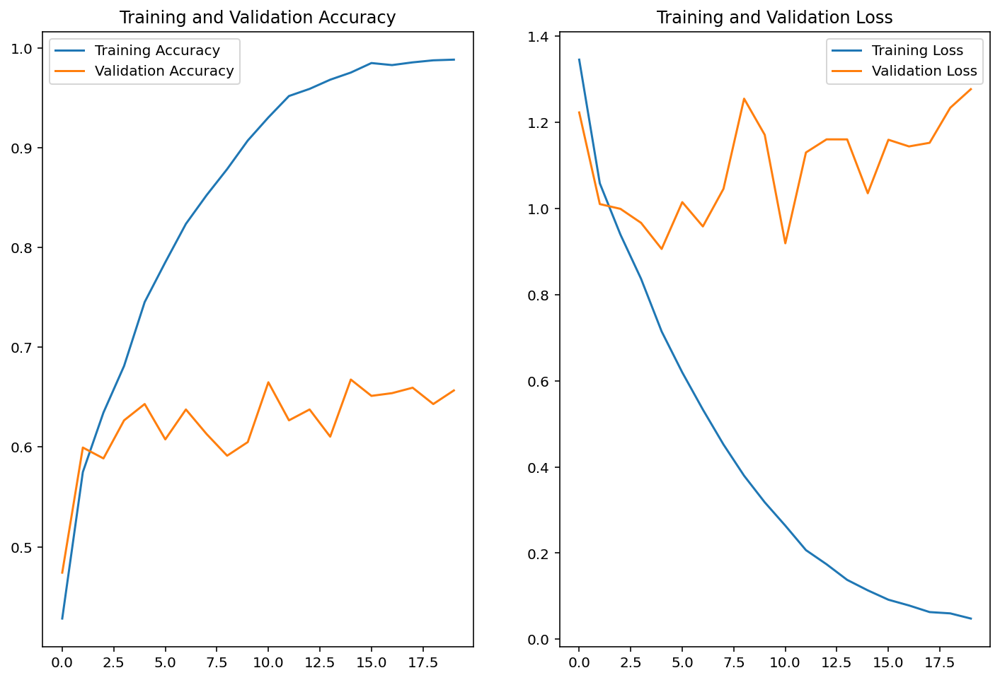

In [23]:
acc = history.history['accuracy']  #학습정확도
val_acc = history.history['val_accuracy']  #검증정확도

loss=history.history['loss']  #학습손실율
val_loss=history.history['val_loss']  #검증손실율

epochs_range = range(EPOCHS)  #EPOCHS = 10

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)  #1행2열중 1열의 그림
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')  #학습/검증 정확도

plt.subplot(1, 2, 2) #1행2열중 2열의 그림
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')  #학습/건증의 손실율
plt.show()

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[1.98384351e-03, 1.73991066e-04, 1.10443734e-01, 8.51564586e-01,
        3.58339027e-02],
       [9.95418429e-01, 4.56516119e-03, 1.38114037e-05, 7.76253373e-09,
        2.55355940e-06],
       [6.89033329e-01, 1.41708541e-03, 1.60129443e-01, 1.49195388e-01,
        2.24805539e-04],
       [4.03759629e-01, 2.07485452e-01, 2.99877495e-01, 3.74535593e-04,
        8.85029063e-02],
       [9.69624877e-01, 1.38305537e-02, 3.84661747e-04, 9.07352543e-04,
        1.52524859e-02],
       [9.68884766e-01, 5.48850046e-03, 1.38443876e-02, 5.22461505e-06,
        1.17771495e-02],
       [2.45598541e-03, 3.47546153e-02, 9.40698266e-01, 1.43266260e-03,
        2.06584483e-02],
       [3.59999478e-01, 9.54020303e-03, 6.07124567e-02, 3.11135291e-03,
        5.66636503e-01],
       [4.00925346e-05, 1.48152859e-08, 5.45779221e-05, 9.99905229e-01,
        1.32496027e-07],
       [9.99910235e-01, 7.01738172e-05, 1.73002661e-07, 7.93346455e-09,
        1.92773095e-05],
       [9.99966264e-01, 8.1985

* predictions : [5가지 꽃중에 1개]

# prediction 값들을 실제 추론한 라벨로 변환

### 0: dandelion(민들레), 1:daisy(데이지), 2:tulips(튤립), 3:sunflowers(해바라기), 4:roses(장미)

In [25]:
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 0, 0, 0, 0, 2, 4, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 0, 4, 2, 0,
       2, 0, 1, 0, 2, 1, 2, 1, 0, 0])

# prediction 시각화

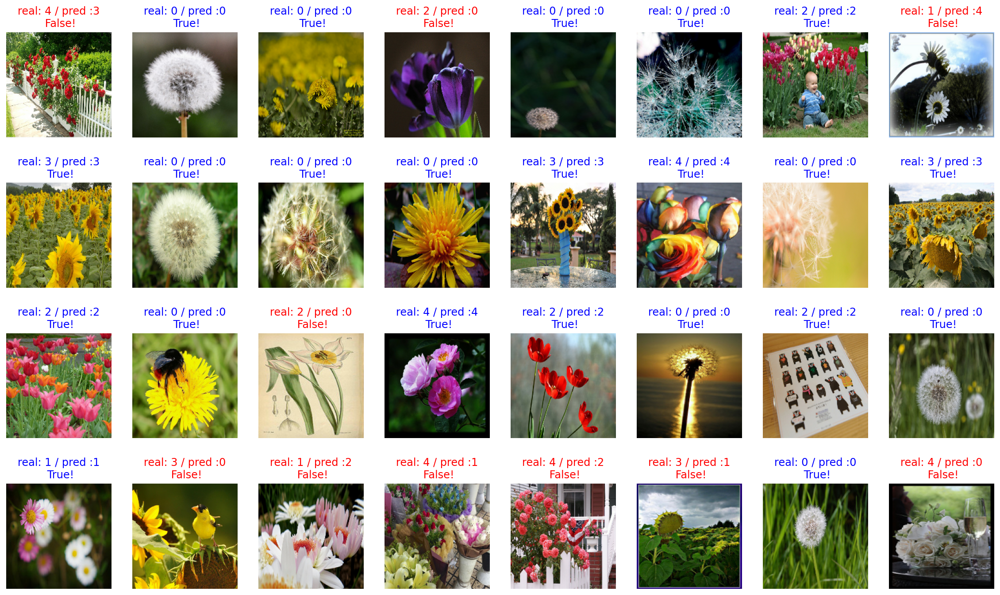

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
# 예측(prediction)의 정확도(accuracy) 갯수 구하기
    
count = 0   # 정답을 맞춘 개수

for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count= count + 1

print(count / 32 * 100)

68.75


# 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [28]:
# 사전 학습된 VGG16 모델 로드 및 새로운 모델 구성
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)  #IMG_SIZE = 180 # 리사이징할 이미지의 크기 (180,180,3)

# VGG16 모델 불러오기 (include_top=False로 마지막 분류 레이어 제외)
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [29]:
# 원래 사이즈를 확인(image_batch), 32는 이미지의 장수
image_batch.shape

TensorShape([32, 180, 180, 3])

In [30]:
# 이 벡터는 이미지에서 특징을 추출해 낸 "특징 벡터"라고 부르기도 합니다
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [31]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 180, 180, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 180, 180, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 180, 180, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 90, 90, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 90, 90, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 90, 90, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 45, 45, 128)       0     

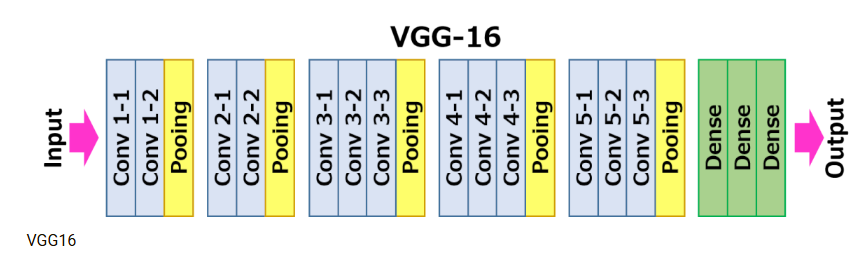

# VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기

In [32]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

* Flattening 하는 것보다 조금 더 좋은 방법 -> Global Average Pooling

* 높은 차원을 다루려면 그 차원을 다룰 수 있는 많은수의 파라미터들을 필요로 합니다.
  - 하지만 파라미터가 너무 많아지면 학습 시 over fitting이 발생할 수 있는 문제가 발생하곤 합니다. 
  - 따라서 필터에 사용된 파라미터 수를 줄여서 차원을 감소시킬 방법이 필요합니다
  - 이런 역할을 CNN에서 해 주는 레이어가 pooling layer
  
* Global Average Pooling   (GAP)
  - Max(Average) Pooling 보다 더 급격하게 feature의 수를 줄입니다
  - 평균 값을 취하는 방법
  - feature의 모든 값들을 이용하면서 (평균) 하면서 feature의 크기를 줄여 차원을 감소시킵니다
  - GAP의 목적은 feature를 1차원 벡터로 만들기 위함입니다
  - GAP는 CNN + FC(Fully Connected) Layer에서 classifier인 FC Layer를 없애기 위한 방법으로 도입
  - GAP는 어떤 크기의 feature 라도 같은 채널의 값들을 하나의 평균 값으로 대체하기 때문에 벡터가 됩니다
  - 어떤 사이즈의 입력이 들어와도 상관이 없습니다
  -  (H, W, C) → (1, 1, C) 크기로 줄어드는 연산이므로, 파라미터가 추가되지 않으므로 학습 측면에서도 유리

In [33]:
# 글로벌 평균 풀링 레이어 정의
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [34]:
# 특성 맵을 평균 풀링하여 벡터로 변환
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [35]:
# 완전 연결층 및 출력층 정의
dense_layer = Dense(512, activation='relu')
prediction_layer = Dense(5, activation='softmax')

# 예측 배치 생성 (평균 풀링 후 완전 연결층과 출력층 통과)
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


* 우리의 데이터들은 처음에 이미지에서 특징을 추출해 줄 VGG16, base_model에 입력되어 특징이 추출된 다음, 
* 그 특징 벡터는 global_average_layer를 거쳐 마지막에 prediction_layer까지 통과하며 5종의 꽃중 하나를 예측하게 될 것입니다.

In [36]:
# VGG16 모델의 가중치를 동결 (학습되지 않도록 설정)
base_model.trainable = False

In [37]:
# 최종 모델 구성
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [38]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


# VGG16을 기반 이미지 분류기 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

In [39]:
# 모델 컴파일
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [40]:
# 간단한 모델 성능 확인
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 5s 89ms/step - loss: 1.6087 - accuracy: 0.2156
initial loss: 1.61
initial accuracy: 0.22


In [41]:
# 모델 학습
EPOCHS = 20

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 17s 170ms/step - loss: 1.3191 - accuracy: 0.5480 - val_loss: 1.0696 - val_accuracy: 0.6975
Epoch 2/20
92/92 [==============================] - 11s 109ms/step - loss: 0.9804 - accuracy: 0.7183 - val_loss: 0.8515 - val_accuracy: 0.7411
Epoch 3/20
92/92 [==============================] - 11s 111ms/step - loss: 0.8124 - accuracy: 0.7585 - val_loss: 0.7490 - val_accuracy: 0.7548
Epoch 4/20
92/92 [==============================] - 11s 113ms/step - loss: 0.7134 - accuracy: 0.7830 - val_loss: 0.6791 - val_accuracy: 0.7684
Epoch 5/20
92/92 [==============================] - 11s 112ms/step - loss: 0.6494 - accuracy: 0.7953 - val_loss: 0.6291 - val_accuracy: 0.7902
Epoch 6/20
92/92 [==============================] - 11s 113ms/step - loss: 0.6038 - accuracy: 0.8099 - val_loss: 0.5971 - val_accuracy: 0.7820
Epoch 7/20
92/92 [==============================] - 11s 112ms/step - loss: 0.5696 - accuracy: 0.8171 - val_loss: 0.5534 - val_accuracy: 0.8120

# 모델 학습 및 검증의 정확도 및  손실율 결과 시각화

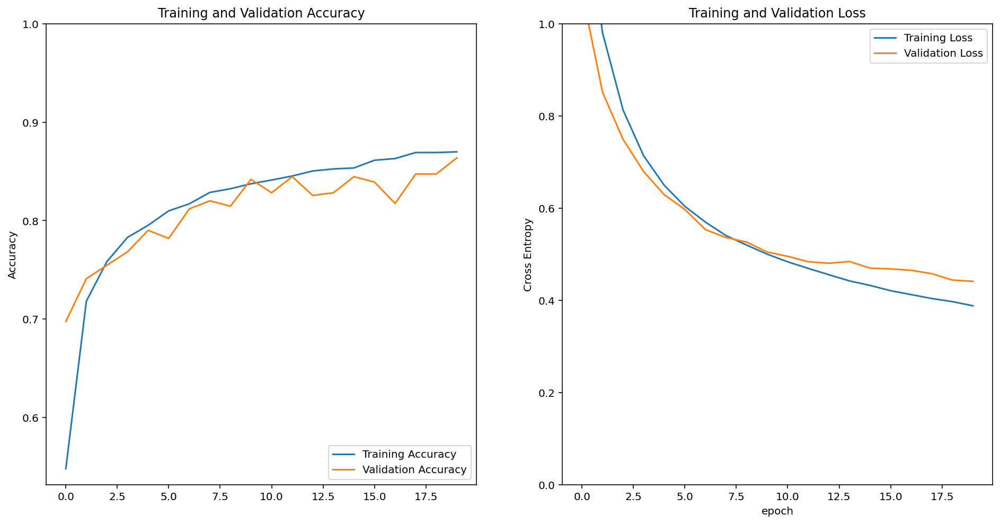

In [42]:
acc = history.history['accuracy']  #정확도(학습)
val_acc = history.history['val_accuracy']  #정확도(검증)

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)   # 학습/검증의 정확도비교
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)  #학습/검증의 손실율비교
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [43]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.75454132e-02, 7.32226595e-02, 8.10109615e-01, 3.07339039e-02,
        6.83883280e-02],
       [9.99785483e-01, 1.95741755e-04, 1.28777276e-06, 9.77451327e-06,
        7.74030377e-06],
       [7.74791360e-01, 1.12701923e-01, 1.06558856e-02, 9.17587280e-02,
        1.00921970e-02],
       [7.01716577e-04, 5.97877707e-03, 8.26002657e-01, 1.58445770e-03,
        1.65732354e-01],
       [7.80582011e-01, 1.96152374e-01, 7.32970098e-03, 7.86633231e-03,
        8.06960184e-03],
       [9.75781620e-01, 1.53454160e-02, 8.99601902e-04, 7.72497663e-03,
        2.48299679e-04],
       [6.30265847e-03, 6.83201384e-03, 9.29157436e-01, 1.79715231e-02,
        3.97364609e-02],
       [3.02659124e-01, 6.21909201e-01, 5.32168080e-04, 7.34516606e-02,
        1.44791044e-03],
       [9.60454252e-03, 1.98655203e-03, 1.75549481e-02, 9.34518814e-01,
        3.63352373e-02],
       [9.99754369e-01, 2.35680694e-04, 3.22763526e-07, 8.28911925e-06,
        1.28626857e-06],
       [9.79366243e-01, 1.8904

In [44]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

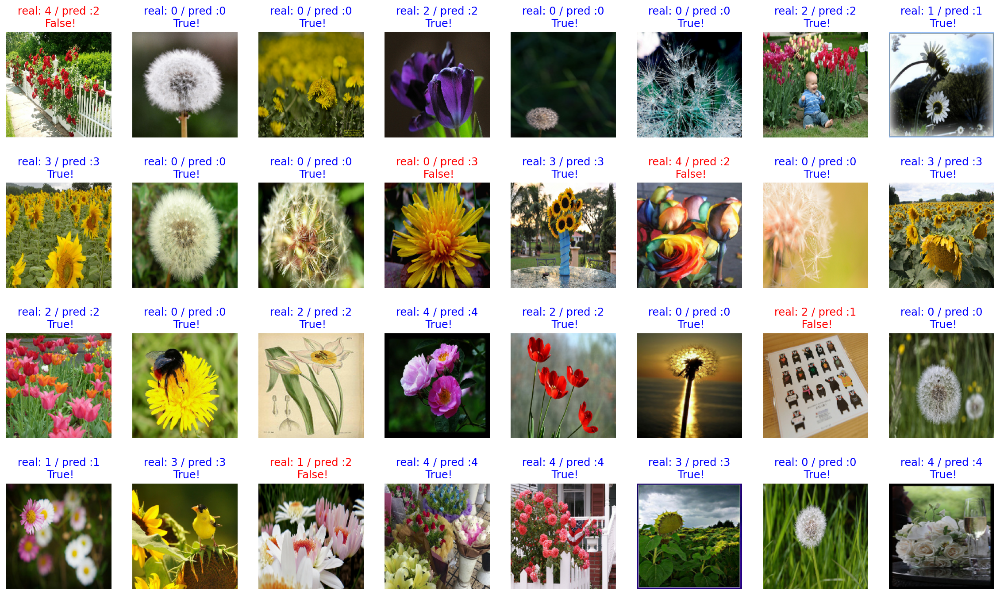

In [45]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [46]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 87% 내외

84.375


# MobileNetV2 모델 사용
* 데이터 증강 추가
* 하이퍼 파라미터 조정
* 옵티마이저(아담)
* 콜백, 데이터셋 prepetch 적용

In [47]:
# MobileNetV2를 사용한 새로운 모델 정의 및 학습
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.layers import (RandomFlip, RandomRotation, RandomZoom, 
                                     RandomContrast, RandomHeight, RandomWidth)
from tensorflow.keras import mixed_precision

# 혼합 정밀도 설정
mixed_precision.set_global_policy('mixed_float16')

# 이미지 크기 및 입력 형태 유지
IMG_SIZE = 180  # 원래 사용하던 이미지 크기
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# 데이터 증강 레이어 정의
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.2), # 랜덤 회전
    RandomZoom(0.2), # 랜덤 줌
    RandomHeight(0.2), # 랜덤 높이 조정
    RandomWidth(0.2) # 랜덤 너비 조정
])

# MobileNetV2 모델 불러오기
base_model = MobileNetV2(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False

# 모델 구성
model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax', dtype='float32')  # float32로 캐스팅
])

# 콜백 설정
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)
early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

callbacks = [reduce_lr, early_stopping]

# 모델 컴파일
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

# 데이터셋에 prefetch 적용
AUTOTUNE = tf.data.AUTOTUNE
train_batches = train_batches.prefetch(buffer_size=AUTOTUNE)
validation_batches = validation_batches.prefetch(buffer_size=AUTOTUNE)

# 모델 학습
EPOCHS = 25
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=callbacks)


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Tesla T4, compute capability 7.5


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Tesla T4, compute capability 7.5


9420800/9406464 [==============================] - 0s 0us/step
Epoch 1/25
92/92 [==============================] - 11s 67ms/step - loss: 1.1797 - accuracy: 0.5565 - val_loss: 0.5658 - val_accuracy: 0.8093
Epoch 2/25
92/92 [==============================] - 5s 47ms/step - loss: 0.7067 - accuracy: 0.7289 - val_loss: 0.4664 - val_accuracy: 0.8392
Epoch 3/25
92/92 [==============================] - 4s 42ms/step - loss: 0.5885 - accuracy: 0.7824 - val_loss: 0.4094 - val_accuracy: 0.8692
Epoch 4/25
92/92 [==============================] - 4s 40ms/step - loss: 0.5398 - accuracy: 0.8052 - val_loss: 0.3804 - val_accuracy: 0.8801
Epoch 5/25
92/92 [==============================] - 4s 39ms/step - loss: 0.5090 - accuracy: 0.8093 - val_loss: 0.3640 - val_accuracy: 0.8883
Epoch 6/25
92/92 [==============================] - 4s 39ms/step - loss: 0.4796 - accuracy: 0.8246 - val_loss: 0.3518 - val_accuracy: 0.9019
Epoch 7/25
92/92 [==============================] - 4s 38ms/step - loss: 0.4639 - accuracy

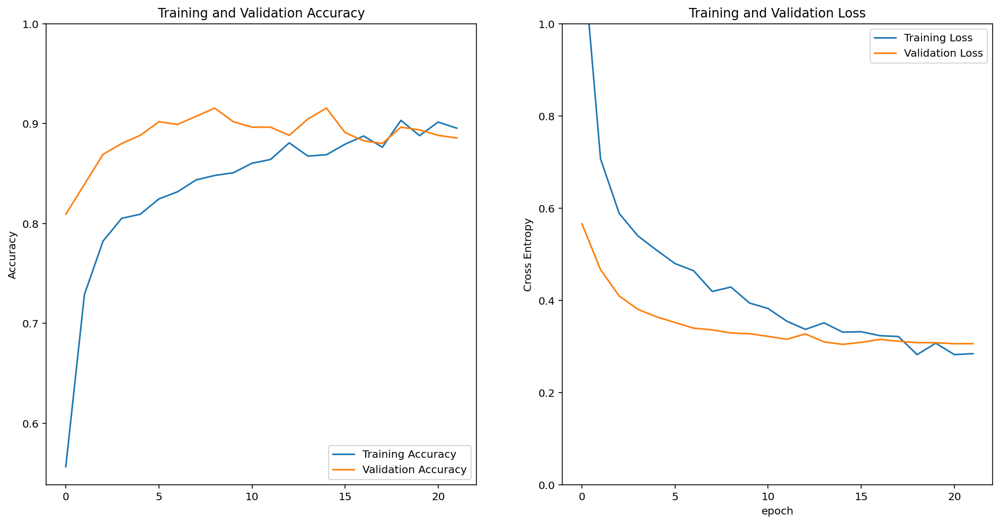

In [48]:
acc = history.history['accuracy']  #정확도(학습)
val_acc = history.history['val_accuracy']  #정확도(검증)

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)   # 학습/검증의 정확도비교
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)  #학습/검증의 손실율비교
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [49]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.91389734e-03, 1.30306650e-02, 9.69924331e-01, 1.01035077e-03,
        1.41207837e-02],
       [9.98842299e-01, 3.96409887e-04, 4.45064012e-04, 1.54148482e-04,
        1.62136756e-04],
       [9.44896638e-01, 1.17641054e-02, 5.92525816e-04, 4.15545218e-02,
        1.19231292e-03],
       [8.50425437e-02, 2.57547766e-01, 5.14506280e-01, 2.25024670e-02,
        1.20400965e-01],
       [9.99236465e-01, 2.42781898e-04, 5.09493366e-05, 4.26326995e-04,
        4.34552785e-05],
       [9.99476016e-01, 2.22471237e-04, 5.42436355e-05, 2.19395170e-05,
        2.25459939e-04],
       [3.32501531e-03, 6.68043494e-02, 8.83805037e-01, 6.01627072e-03,
        4.00493108e-02],
       [3.13477486e-01, 3.87602091e-01, 3.50911655e-02, 1.92251593e-01,
        7.15776384e-02],
       [7.59762600e-02, 8.92448646e-04, 1.08530652e-02, 9.11865950e-01,
        4.12244961e-04],
       [9.99853611e-01, 9.18484511e-05, 8.80810967e-06, 3.36265948e-05,
        1.20125478e-05],
       [9.95757163e-01, 2.5548

In [50]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 1, 4, 4, 3, 0, 4])

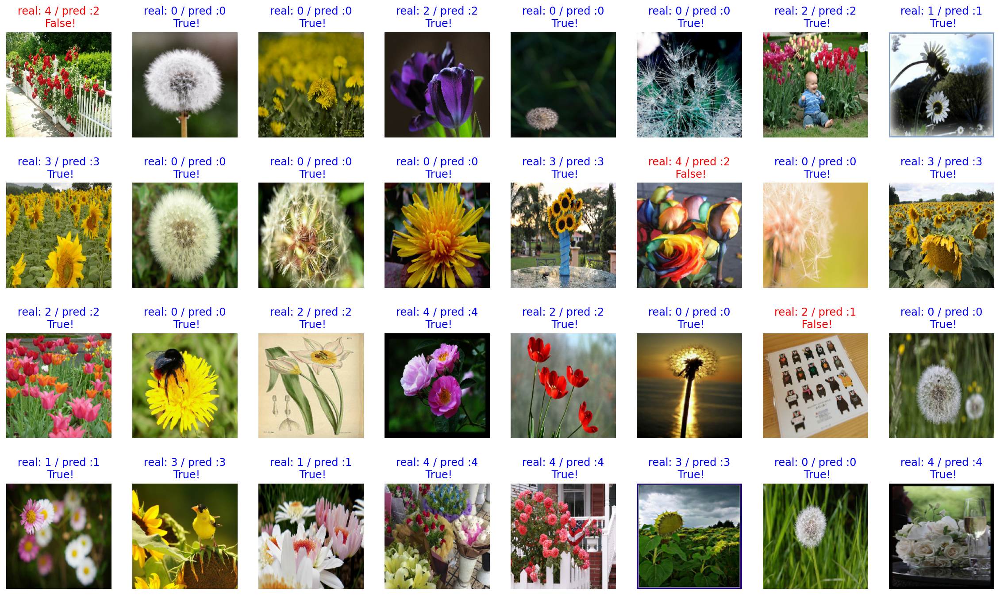

In [51]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [52]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 87% 내외

90.625


# 결과 정리
## * 텐서 플로우를 사용한 초기 모델의 val_loss는 1.0과 val_accuracy는 0.6 
## * VGG16의 val_loss는 0.4과 val_accuracy는 0.8 
## * MobileNetV2의 val_loss는 0.3과 val_accuracy는 0.9에 도달했습니다
## * 가장 좋은 모델로 MobileNetV2를 선정하였습니다.

# 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기

In [53]:
!mkdir -p ~/aiffel/tf_flowers_load/checkpoint
!mkdir -p ~/aiffel/tf_flowers_load/images

#### 본인이 테스트할 이미지파일을 ~/aiffel/tf_flowers_load/images 에 올린다.(현재는 18장의 이미지 추가)

In [54]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/tf_flowers_load/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

# 디렉토리 존재 여부 확인 및 생성
if not os.path.exists(checkpoint_dir):
    os.mkdir(checkpoint_dir)
    
# 모델 가중치 저장
model.save_weights(checkpoint_file_path)     

# 파일 생성 확인
if os.path.exists(checkpoint_file_path):
    print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


# 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

In [55]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [56]:
IMG_SIZE = 180
img_dir_path = os.getenv("HOME") + "/aiffel/tf_flowers_load/images"
print(img_dir_path)

/aiffel/aiffel/tf_flowers_load/images


In [57]:
def show_and_predict_image(dirpath, filename, img_size=180):
    filepath = os.path.join(dirpath, filename)
    print(f"filepath: {filepath}")
    
    image = load_img(filepath, target_size=(img_size, img_size)) #target_size 크기로 이미지로딩
    plt.imshow(image)
    plt.axis('off')
    
    image = img_to_array(image).reshape(1, img_size, img_size, 3)  #모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환
    prediction = model.predict(image)[0]  #모델예측
    #print(prediction)
    
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    
    print(str(dandelion_percentage)+':민',str(daisy_percentage)+':데',str(tulips_percentage)+':튤',str(sunflowers_percentage)+':해',str(roses_percentage)+':장')
    
    #0: dandelion(민들레), 1:daisy(데이지), 2:tulips(튤립), 3:sunflowers(해바라기), 4:roses(장미)
    
    if dandelion_percentage > 0:
        print(f"This image seems {dandelion_percentage}% dandelion(민들레) ")
    elif daisy_percentage > 0:
        print(f"This image seems {daisy_percentage}% daisy(데이지) ")
    elif tulips_percentage > 0:
        print(f"This image seems {tulips_percentage}% tulips(튤립) ")
    elif sunflowers_percentage > 0:
        print(f"This image seems {sunflowers_percentage}% sunflowers(해바라기) ")
    elif roses_percentage > 0:
        print(f"This image seems {roses_percentage}% roses(장미) ")
    else:
        print("자료를 확인하세요.")
    
    #print(f"This image seems {dandelion_percentage}% dandelion(민들레), and {daisy_percentage}% daisy(데이지), and {tulips_percentage}% tulips(튤립), and {sunflowers_percentage}% sunflowers(해바라기), and {roses_percentage}% roses(장미).")

filepath: /aiffel/aiffel/tf_flowers_load/images/10.jpg
11:민 30:데 33:튤 0:해 26:장
This image seems 11% dandelion(민들레) 


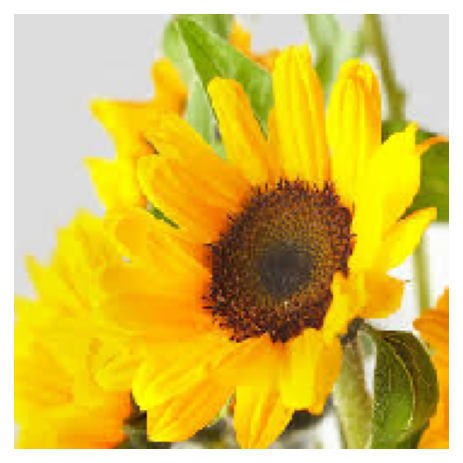

In [59]:
#filename만 바꾸어 원하는대로 실험가능

filename = '10.jpg'

show_and_predict_image(img_dir_path, filename)  #img_dir_path=/aiffel/aiffel/tf_flowers_load/images, filename=10.jpg

filepath: /aiffel/aiffel/tf_flowers_load/images/11.jpg
14:민 8:데 44:튤 0:해 33:장
This image seems 14% dandelion(민들레) 


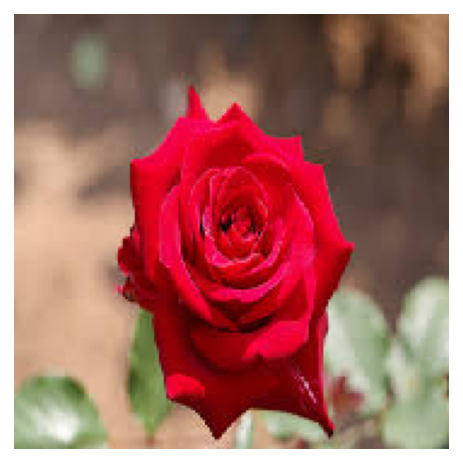

In [60]:
filename = '11.jpg'

show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/12.jpg
16:민 17:데 31:튤 0:해 36:장
This image seems 16% dandelion(민들레) 


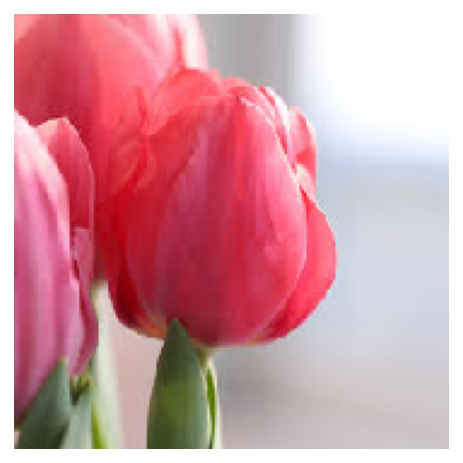

In [61]:
filename = "12.jpg"
show_and_predict_image(img_dir_path, filename)

filepath: /aiffel/aiffel/tf_flowers_load/images/13.jpg
10:민 63:데 19:튤 1:해 7:장
This image seems 10% dandelion(민들레) 


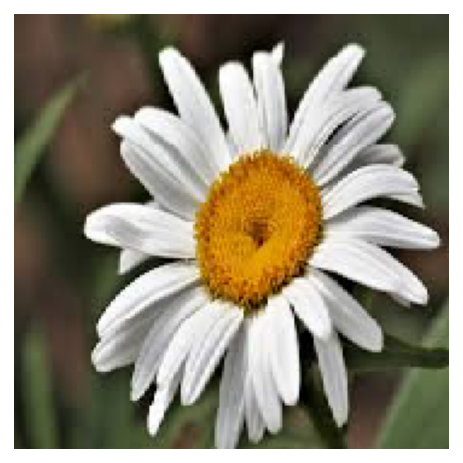

In [62]:
filename = "13.jpg"
show_and_predict_image(img_dir_path, filename)

# 회고

### 노은하
- 강아지 고양이 분류기를 그대로 이용하고 단지 dense층의 분류갯수와 데이터셋 로드한 주소만 바꿔주어도
  기존 분류기로 꽃5종을 분류하는 분류기로 손색이 없는것을 보고 좀 놀랐다.
  물론87%라 아직 하이퍼 파리메타나 자료를 추가적으로 증강하여 자료의 갯수를 좀더 늘려서
  학습하면 좀더 나은 정확도가 나올것도 같다.
  
- tensorflow_datasets 에서 데이타셋을 다운로드 하는 방법이 여러가지가 있고
  그 방법에 따라 자료를 처리하는 차이를 좀 알아 두어야 할거 같다.
  
- 이미지중 자료를 못 알아보는 노이즈가 많은 자료나, 꽃 종류에 안맞는 자료가 있는지 확인이
  좀 필요해보인다. 급하게 하느라 자료의 전처리중 이상치나 중복치는 확인을 못했는데
  우선 그것도 확인을필히 해보는게 학습함에 있어 더 나은 성능평가를 할수 있지 않을까 생각한다.
  
### 신상호 
- 5가지 클래스를 분류하는 것은 2가지일 때보다 난이도는 물론 정확도를 끌어 올리기가 어려웠습니다.  
  하이퍼 파라미터 조정이 끼치는 영향, 무거운 모델의 단점, 여러 가지 모델을 사용해야 하는 이유를 
  이번 퀘스트 코드를 작성하며 배웠고 MobileNetV2 모델로 제시된 조건을 만족할 수 있었습니다. 
  EfficientNetB0 모델을 활용해 보려고 시간을 많이 사용했는데 원하는 수준까지 
  끌어올리지 못해 제외한 점이 아쉽습니다.